### 1. Entendimiento del negocio 
Hacemos parte del equipo de cadena de abastecimiento de una emorpesa de higiene y belleza, donde debemos lograr predecir la rentabilidad futura de los   
productos según ciertos datos que se tienen sobre la producción de estos productos, se espera llegar a un modelo con un MAPE menor o igual al 15%  

Estos son los datos que se tienen 

Variable Descripción 
Product type Tipo de producto   
SKU Identificador del producto  
Price Precio de venta del producto  
Availability Disponibilidad del producto  
Number of products sold Cantidad vendida del producto  
Customer demographics Género asociado al comprador del producto  
Stock levels Inventario de mantenimiento  
Lead times Tiempo de entrega estimado en días  
Order quantities Cantidad de órdenes del producto  
Shipping times Tiempo en meses de embarque  
Shipping carriers Tipo de envío  
Shipping costs Costo de envío  
Supplier Tipo de proveedor  
Lcation Ubicación del envío  
Lead time Tiempo real de entrega en días  
Production volume Volumen de producción  
Manufacturing lead time Tiempo de producción en días  
Manufacturing costs Costo de manufactura de un producto  
Inspection results Resultado de la inspección del producto  
Defect rates Tasa de defectuosos  
Transportation modes Mecanismo de transporte del producto  
Routes Tipo de ruta de envío  
Costs Costos totales  
Reveneu generated Utilidad generada 

In [ ]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')
seed = 42

In [2]:
df = pd.read_csv('./Datos/Regcaso2.csv')
prof = ProfileReport(df , explorative= True)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:00<00:00, 555.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Vemos que en el dataset no tenemos valores nulos, no hay correlación entre las variables e inicialmente solo se debería eliminar el SDK que es el id 

### Transformaciones

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Product type             100 non-null    object 
 1   SKU                      100 non-null    object 
 2   Price                    100 non-null    float64
 3   Availability             100 non-null    int64  
 4   Number of products sold  100 non-null    int64  
 5   Revenue generated        100 non-null    float64
 6   Customer demographics    100 non-null    object 
 7   Stock levels             100 non-null    int64  
 8   Lead times               100 non-null    int64  
 9   Order quantities         100 non-null    int64  
 10  Shipping times           100 non-null    int64  
 11  Shipping carriers        100 non-null    object 
 12  Shipping costs           100 non-null    float64
 13  Supplier name            100 non-null    object 
 14  Location                 10

In [4]:
data_mod = df.drop(columns= 'SKU')

In [5]:
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [6]:
num_col = data_mod.select_dtypes(include = ['int64', 'float64']).columns.to_list()
cat_col = data_mod.select_dtypes(include = ['object']).columns.to_list()

numTrans = Pipeline(steps=[('scale', MinMaxScaler())])
catTrans = Pipeline(steps=[('encoder', OneHotEncoder(sparse_output = True))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numTrans, num_col),
        ('cat', catTrans, cat_col)
    ],
    remainder='passthrough'
)

preprocessor


,transformers,"[('num', ...), ('cat', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True
,force_int_remainder_cols,'deprecated'
,feature_range,"(0, ...)"
,copy,True
,clip,False


In [7]:
data_pre = preprocessor.fit_transform(data_mod)
cod_cat = preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(cat_col)
labels = np.concatenate((num_col, cod_cat))
data_pro = pd.DataFrame(data_pre, columns=labels)



In [8]:
from sklearn.model_selection import train_test_split

(70, 44) (70, 1)


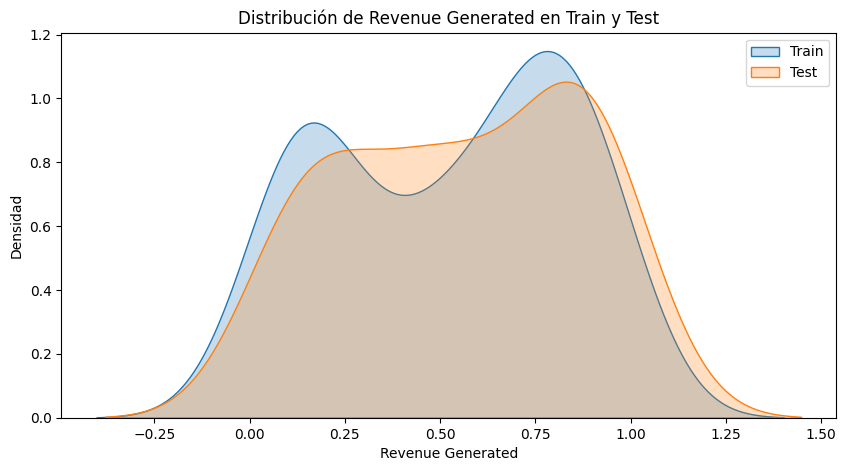

In [42]:
x = data_pro.drop('Revenue generated', axis=1)
y = data_pro[['Revenue generated']]

X_train, X_test, Y_train, Y_test = train_test_split(x, y, train_size=0.7, random_state= 123)
print(X_train.shape , Y_train.shape)

# grafica de distribucion de train y test 
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,5))
sns.kdeplot(Y_train['Revenue generated'], label='Train', fill=True)
sns.kdeplot(Y_test['Revenue generated'], label='Test', fill=True)
plt.title('Distribución de Revenue Generated en Train y Test')
plt.xlabel('Revenue Generated')
plt.ylabel('Densidad')
plt.legend()
plt.show()



#### Modelado 

In [43]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [44]:
modelo_1 = LinearRegression()
modelo_1.fit(X_train, Y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [46]:
modelo_2 = KNeighborsRegressor()

param_grid = {'n_neighbors': [2,3, 5, 12, 21, 30, 35, 36, 34, 37 , 38 ,40 ,100], 'p': [1, 2]}

reg_2 = GridSearchCV(estimator=modelo_2, param_grid=param_grid, cv=3, n_jobs=-1, scoring='r2')
reg_2.fit(X_train, Y_train)

validation = pd.concat([pd.DataFrame(reg_2.cv_results_['params']),
                        pd.DataFrame(reg_2.cv_results_['mean_test_score'], columns=['MAPE'])], axis=1)
validation.sort_values('MAPE', ascending=False)

,n_neighbors,p,MAPE
8,21,1,-0.026942
13,35,2,-0.027040
15,36,2,-0.027118
17,34,2,-0.029843
19,37,2,-0.033439
16,34,1,-0.034105
12,35,1,-0.035700
11,30,2,-0.036703
21,38,2,-0.037094
14,36,1,-0.038809


In [47]:
modelo_2_final = reg_2.best_estimator_
modelo_2_final

,n_neighbors,21
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [48]:
modelo_3 = SVR()

param_grid = {'C': [0, 0.001, 0.1, 1, 10, 100], 'kernel': ['linear', 'poly', 'rbf'], 'degree': [2, 3]}

reg_3 = GridSearchCV(estimator=modelo_3, param_grid=param_grid, cv=3, n_jobs=-1, scoring='neg_mean_absolute_percentage_error')
reg_3.fit(X_train, Y_train)

validation = pd.concat([pd.DataFrame(reg_3.cv_results_['params']),
                        pd.DataFrame(reg_3.cv_results_['mean_test_score'], columns=['MAPE'])], axis=1)
validation.sort_values('MAPE', ascending=False)

,C,degree,kernel,MAPE
30,100.000,2,linear,-1.760719e+13
33,100.000,3,linear,-1.760719e+13
24,10.000,2,linear,-2.218892e+13
27,10.000,3,linear,-2.218892e+13
32,100.000,2,rbf,-3.093258e+13
26,10.000,2,rbf,-3.093258e+13
23,1.000,3,rbf,-3.093258e+13
20,1.000,2,rbf,-3.093258e+13
29,10.000,3,rbf,-3.093258e+13
35,100.000,3,rbf,-3.093258e+13


In [49]:
modelo_3_final = reg_3.best_estimator_
modelo_3_final

,kernel,'linear'
,degree,2
,gamma,'scale'
,coef0,0.0
,tol,0.001
,C,100
,epsilon,0.1
,shrinking,True
,cache_size,200
,verbose,False
,max_iter,-1


In [50]:
modelo_4 = DecisionTreeRegressor()

param_grid = {'criterion' : ['friedman_mse' , 'poisson', 'squared_error' , 'absolute_error'] , 'max_depth' : [None , 4 , 4, 5, 10 ,100],
              'min_samples_split' : [2,3] , 'max_leaf_nodes' : [None, 2, 3, 4] }


reg_4 = GridSearchCV(estimator=modelo_4, param_grid = param_grid, cv=5, n_jobs=-1, scoring='neg_mean_absolute_percentage_error')
reg_4.fit(X_train, Y_train)

validation = pd.concat([pd.DataFrame(reg_4.cv_results_['params']),
                        pd.DataFrame(reg_4.cv_results_['mean_test_score'], columns=['MAPE'])], axis=1)
validation.sort_values('MAPE', ascending=False)

,criterion,max_depth,max_leaf_nodes,min_samples_split,MAPE
120,squared_error,5.0,NaN,2,-6.217152e+12
128,squared_error,10.0,NaN,2,-6.217152e+12
49,poisson,NaN,NaN,3,-6.217152e+12
64,poisson,4.0,NaN,2,-6.217152e+12
80,poisson,10.0,NaN,2,-6.217152e+12
...,...,...,...,...,...
169,absolute_error,5.0,NaN,3,-5.338580e+13
168,absolute_error,5.0,NaN,2,-5.338580e+13
176,absolute_error,10.0,NaN,2,-5.405080e+13
145,absolute_error,NaN,NaN,3,-5.476265e+13


In [51]:
modelo_4_final = reg_4.best_estimator_
modelo_4_final

,criterion,'squared_error'
,splitter,'best'
,max_depth,5
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,ccp_alpha,0.0


In [52]:
from sklearn.ensemble import RandomForestRegressor

In [63]:
modelo_5 = RandomForestRegressor(random_state=123)
param_grid = {'criterion': ['friedman_mse', 'poisson', 'squared_error', 'absolute_error'],
              'max_depth': [None, 5, 10, 20], 'max_leaf_nodes': [None, 2, 3, 4], 'n_estimators': [100, 200, 300]}
reg_5 = GridSearchCV(modelo_5, param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', n_jobs=-1)
reg_5.fit(X_train, Y_train)
validation = pd.concat([pd.DataFrame(reg_5.cv_results_['params']), 
                        pd.DataFrame(reg_5.cv_results_['mean_test_score'], columns= ['MAPE'])], axis = 1)
validation.sort_values('MAPE', ascending=False)

,criterion,max_depth,max_leaf_nodes,n_estimators,MAPE
12,friedman_mse,5.0,NaN,100,-3.385957e+13
108,squared_error,5.0,NaN,100,-3.415453e+13
60,poisson,5.0,NaN,100,-3.457307e+13
96,squared_error,NaN,NaN,100,-3.469176e+13
132,squared_error,20.0,NaN,100,-3.469176e+13
...,...,...,...,...,...
160,absolute_error,5.0,2.0,200,-4.749250e+13
159,absolute_error,5.0,2.0,100,-4.854101e+13
147,absolute_error,NaN,2.0,100,-4.854101e+13
171,absolute_error,10.0,2.0,100,-4.854101e+13


In [54]:
modelo_5_final = reg_5.best_estimator_
modelo_5_final

,n_estimators,300
,criterion,'absolute_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [64]:
from sklearn.ensemble import AdaBoostRegressor
modelo_6 = AdaBoostRegressor()
param_grid = {'estimator': [DecisionTreeRegressor()], 'n_estimators': [100, 200, 400], 'loss': ['linear', 'square', 'exponential'], 'learning_rate': [0.001, 0.1, 1, 10]}
reg_6 = GridSearchCV(modelo_6, param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', n_jobs = -1)
reg_6.fit(X_train, Y_train)
validation = pd.concat([pd.DataFrame(reg_6.cv_results_['params']), 
                        pd.DataFrame(reg_6.cv_results_['mean_test_score'], columns= ['MAPE'])], axis = 1)
validation.sort_values('MAPE', ascending=False)

,estimator,learning_rate,loss,n_estimators,MAPE
31,DecisionTreeRegressor(),10.000,square,200,-1.686750e+12
30,DecisionTreeRegressor(),10.000,square,100,-1.686750e+12
32,DecisionTreeRegressor(),10.000,square,400,-1.686750e+12
29,DecisionTreeRegressor(),10.000,linear,400,-7.588416e+12
27,DecisionTreeRegressor(),10.000,linear,100,-7.588416e+12
28,DecisionTreeRegressor(),10.000,linear,200,-1.187272e+13
33,DecisionTreeRegressor(),10.000,exponential,100,-3.200814e+13
35,DecisionTreeRegressor(),10.000,exponential,400,-3.416619e+13
6,DecisionTreeRegressor(),0.001,exponential,100,-3.416619e+13
4,DecisionTreeRegressor(),0.001,square,200,-3.672800e+13


In [66]:
modelo_6_final = reg_6.best_estimator_
modelo_6_final

,estimator,DecisionTreeRegressor()
,n_estimators,200
,learning_rate,10
,loss,'square'
,random_state,None
,criterion,'squared_error'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0


In [72]:
from sklearn.ensemble import GradientBoostingRegressor
modelo_7 = GradientBoostingRegressor()
param_grid = {'loss': ['squared_error', 'absolute_error'], 'n_estimators': [500,600,700,800,1000]}
reg_7 = GridSearchCV(modelo_7, param_grid, cv=5, scoring='neg_mean_absolute_percentage_error', n_jobs=-1)
reg_7.fit(X_train, Y_train)
validation = pd.concat([pd.DataFrame(reg_7.cv_results_['params']), 
                        pd.DataFrame(reg_7.cv_results_['mean_test_score'], columns= ['MAPE'])], axis = 1)
validation.sort_values('MAPE', ascending=False)

,loss,n_estimators,MAPE
0,squared_error,500,-2.667238e+13
1,squared_error,600,-2.677312e+13
3,squared_error,800,-2.818285e+13
2,squared_error,700,-2.821798e+13
4,squared_error,1000,-2.862770e+13
5,absolute_error,500,-2.967301e+13
8,absolute_error,800,-3.087507e+13
9,absolute_error,1000,-3.172126e+13
7,absolute_error,700,-3.297859e+13
6,absolute_error,600,-3.460970e+13


In [73]:
modelo_7_final = reg_7.best_estimator_
modelo_7_final

,loss,'squared_error'
,learning_rate,0.1
,n_estimators,500
,subsample,1.0
,criterion,'friedman_mse'
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_depth,3
,min_impurity_decrease,0.0
,init,None


In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [75]:

def evaluar_modelos(modelos, nombres, X_train, X_test, y_train, y_test, y_min, y_max):
    for modelo, nombre in zip(modelos, nombres):
        # Predicciones
        pred_train = modelo.predict(X_train)
        pred_test = modelo.predict(X_test)

        # Desescalar valores
        pred_train_desc = pred_train * (y_max - y_min) + y_min
        pred_test_desc = pred_test * (y_max - y_min) + y_min
        y_train_desc = y_train * (y_max - y_min) + y_min
        y_test_desc = y_test * (y_max - y_min) + y_min

        # Métricas Train
        r2_train = r2_score(y_train_desc, pred_train_desc)
        rmse_train = np.sqrt(mean_squared_error(y_train_desc, pred_train_desc))
        mae_train = mean_absolute_error(y_train_desc, pred_train_desc)
        mape_train = mean_absolute_percentage_error(y_train_desc, pred_train_desc)

        # Métricas Test
        r2_test = r2_score(y_test_desc, pred_test_desc)
        rmse_test = np.sqrt(mean_squared_error(y_test_desc, pred_test_desc))
        mae_test = mean_absolute_error(y_test_desc, pred_test_desc)
        mape_test = mean_absolute_percentage_error(y_test_desc, pred_test_desc)

        # Imprimir métricas
        print(f"\n--- Resultados para {nombre} ---")
        print("Entrenamiento:")
        print(f"R2: {r2_train:.4f}, RMSE: {rmse_train:.4f}, MAE: {mae_train:.4f}, MAPE: {mape_train:.4f}")
        print("Prueba:")
        print(f"R2: {r2_test:.4f}, RMSE: {rmse_test:.4f}, MAE: {mae_test:.4f}, MAPE: {mape_test:.4f}")

        # Gráfica Train
        plt.figure(figsize=(8,4))
        sns.histplot(y_train_desc.values.flatten(), color='red', label='Datos reales Train', kde=True)
        sns.histplot(pred_train_desc.flatten(), color='blue', label='Predicciones Train', kde=True)
        plt.legend()
        plt.title(f"Histograma - Train ({nombre})")
        plt.show()

        # Gráfica Test
        plt.figure(figsize=(8,4))
        sns.histplot(y_test_desc.values.flatten(), color='red', label='Datos reales Test', kde=True)
        sns.histplot(pred_test_desc.flatten(), color='blue', label='Predicciones Test', kde=True)
        plt.legend()
        plt.title(f"Histograma - Test ({nombre})")
        plt.show()



--- Resultados para KNN ---
Entrenamiento:
R2: 0.0473, RMSE: 0.3036, MAE: 0.2703, MAPE: 32774307998940.8359
Prueba:
R2: -0.0921, RMSE: 0.3160, MAE: 0.2809, MAPE: 1.0593


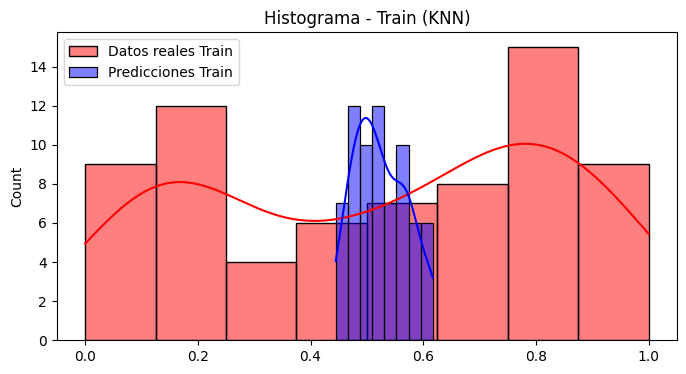

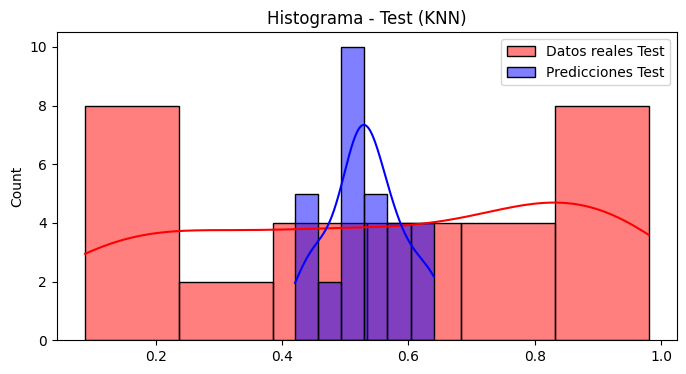


--- Resultados para SVM ---
Entrenamiento:
R2: 0.2569, RMSE: 0.2681, MAE: 0.1872, MAPE: 6418202442316.4912
Prueba:
R2: -2.4066, RMSE: 0.5581, MAE: 0.4442, MAPE: 1.3726


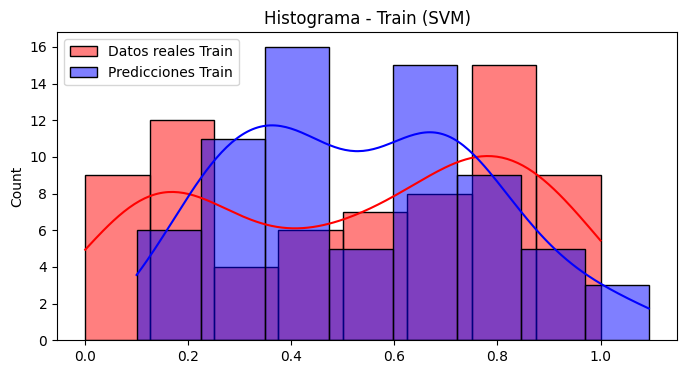

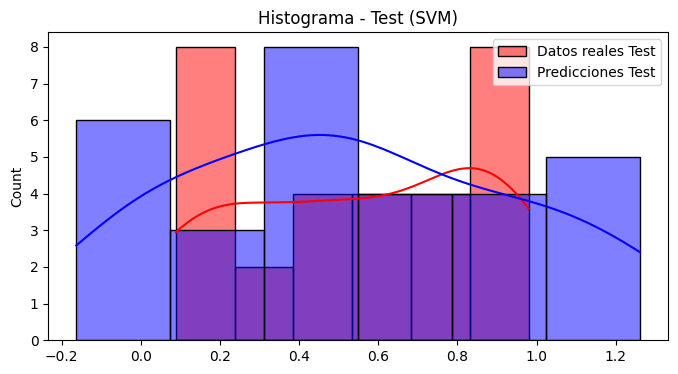


--- Resultados para Árbol ---
Entrenamiento:
R2: 0.9386, RMSE: 0.0771, MAE: 0.0503, MAPE: 0.1757
Prueba:
R2: -0.3792, RMSE: 0.3551, MAE: 0.2721, MAPE: 0.7771


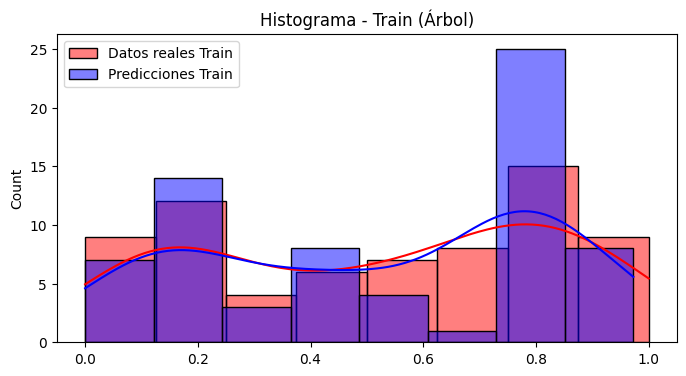

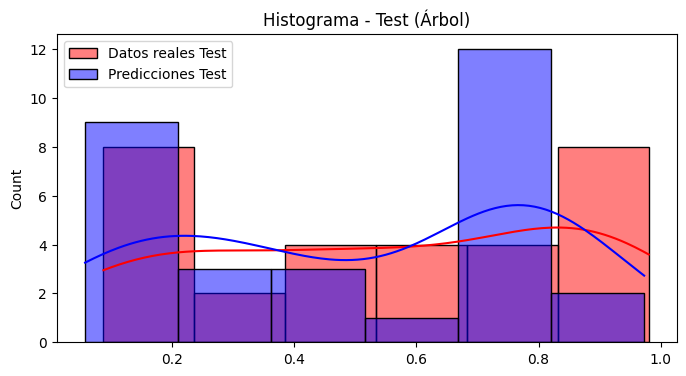


--- Resultados para Random Forest ---
Entrenamiento:
R2: 0.8388, RMSE: 0.1249, MAE: 0.1101, MAPE: 14493106081999.9570
Prueba:
R2: -0.1156, RMSE: 0.3194, MAE: 0.2812, MAPE: 1.0113


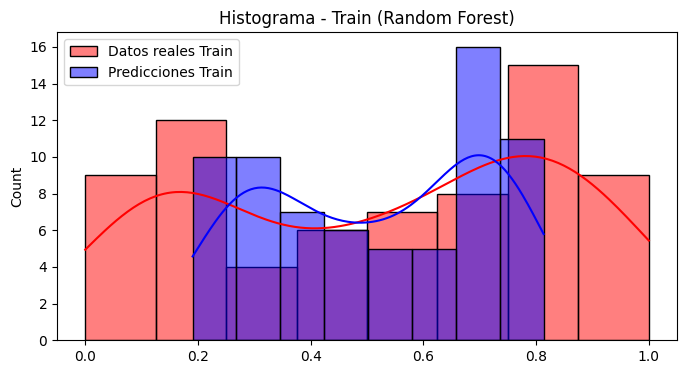

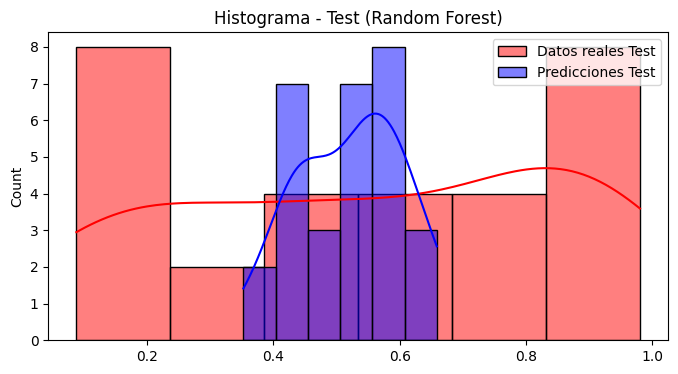


--- Resultados para ADBoost ---
Entrenamiento:
R2: -2.0009, RMSE: 0.5388, MAE: 0.4403, MAPE: 62182189791133.3594
Prueba:
R2: -1.8232, RMSE: 0.5080, MAE: 0.4098, MAPE: 2.0205


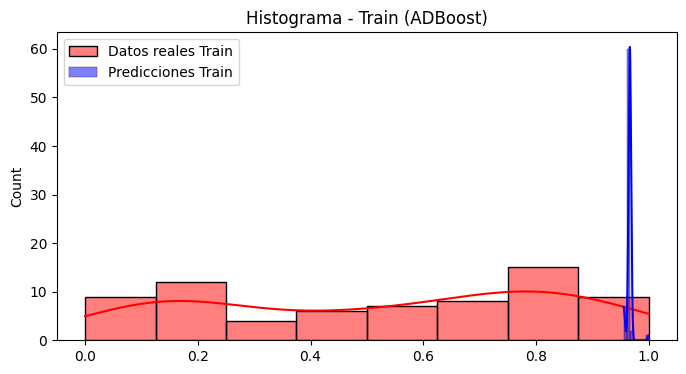

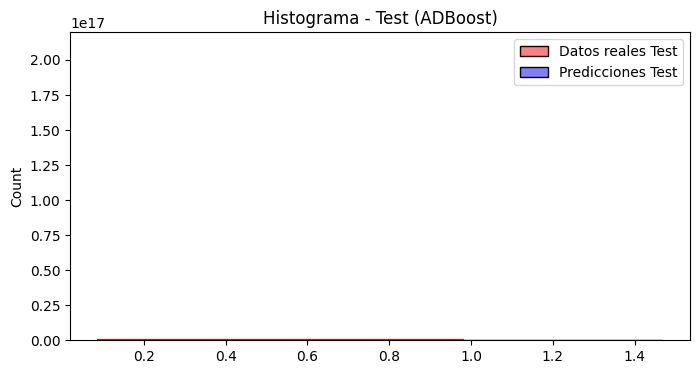


--- Resultados para GradientBoost ---
Entrenamiento:
R2: 1.0000, RMSE: 0.0000, MAE: 0.0000, MAPE: 6545735.0415
Prueba:
R2: -0.4772, RMSE: 0.3675, MAE: 0.2994, MAPE: 1.0522


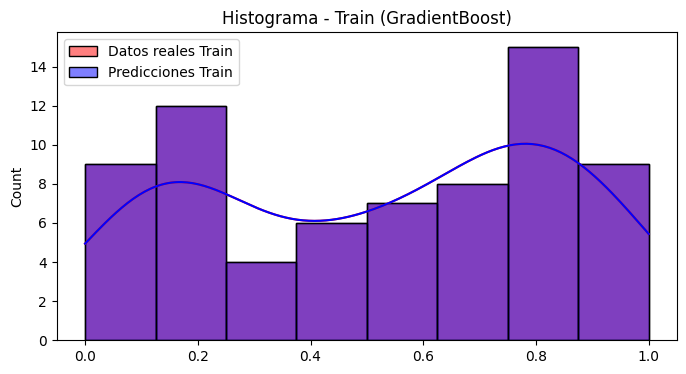

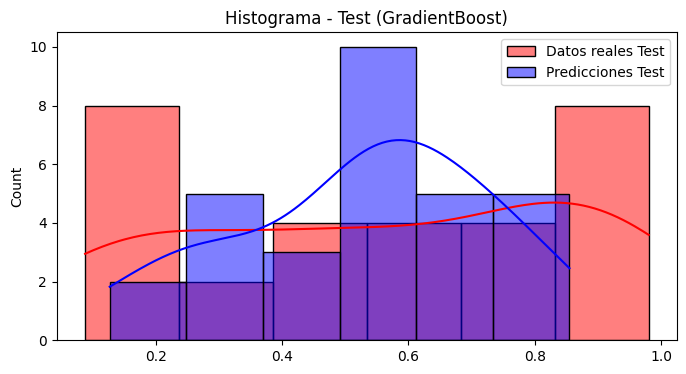

In [71]:
modelos = [ modelo_2_final, modelo_3_final, modelo_4_final, modelo_5_final, modelo_6_final, modelo_7_final]  # tu lista de modelos
nombres = ['KNN', 'SVM', "Árbol", "Random Forest", 'ADBoost', 'GradientBoost']  # nombres para mostrar
y_min, y_max = np.min(y), np.max(y)

evaluar_modelos(modelos, nombres, X_train, X_test, Y_train, Y_test, y_min, y_max)
